## Semantic Segmentation for Self-Driving Cars
### This algorithm takes images taken from the perspective of the front of a vehicle and segments the different parts of the images into classes. Self-driving cars use this information to decide if, how, and where to drive.

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from keras.layers import Conv2D,MaxPooling2D,BatchNormalization,Conv2DTranspose,UpSampling2D,concatenate,Dropout
import matplotlib.pyplot as plt
import random
import os
from pathlib import Path

### The data consists of two sets: the input data, which are images of streets, and target data, which are image-sized matrices consisting of labels. These matrices are known as masks because they act as masks over the images that effectively segment them into the various classes. 
### Each individual pixel is classified as belonging to one of thirteen classes, with each class representing a category of things one may see while driving.
### The labels are:

#### 0  - Sky
#### 1 - Buildings
#### 2 - Fences
#### 3 - Miscellaneous objects
#### 4 - People
#### 5 - Lampposts, barriers, poles
#### 6 - Street markings
#### 7  - Road
#### 8  - Sidewalk
#### 9  - Trees & other plants
#### 10 - Cars
#### 11 - Walls
#### 12 - Traffic lights, streets signs

In [2]:
cd = Path.cwd()
data_path = cd/r'OneDrive\Desktop\Datasets\Car Semantic Segmentation'
image_folder_name = 'CameraRGB'
mask_folder_name = 'CameraSeg'

image_files = []
mask_files = []

for file in os.listdir(data_path):
    
    image_folder = os.path.join(data_path,file,image_folder_name)
    for image_file in os.listdir(image_folder):
        image_files.append(os.path.join(image_folder,image_file))
        
    mask_folder = os.path.join(data_path,file,mask_folder_name)
    for mask_file in os.listdir(mask_folder):
        mask_files.append(os.path.join(mask_folder,mask_file))

### This function takes two files, one for an image and another for its corresponding mask, and returns the full image and mask, resized to be 300x400 pixels.

In [3]:
height = 300
width = 400

def image_and_mask(image_file,mask_file):
    image = tf.io.read_file(image_file)
    image = tf.io.decode_image(image)
    image = tf.image.convert_image_dtype(image,tf.float32)
    image.set_shape((600,800,3))
    image = tf.image.resize(image,(height,width),method='nearest')
    mask = tf.io.read_file(mask_file)
    mask = tf.io.decode_image(mask)
    mask.set_shape((600,800,3))
    mask = tf.image.resize(mask,(height,width),method='nearest')
    mask = tf.reduce_sum(mask,axis=-1)
    return image,mask

### A few examples of what image-mask pairs look like:

                      Images:                                                          Masks:


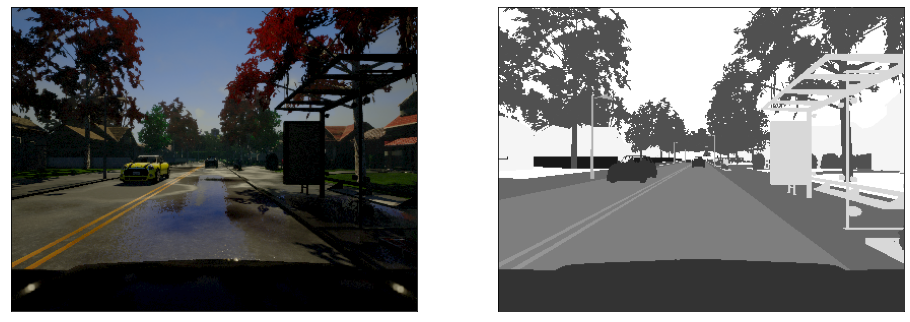

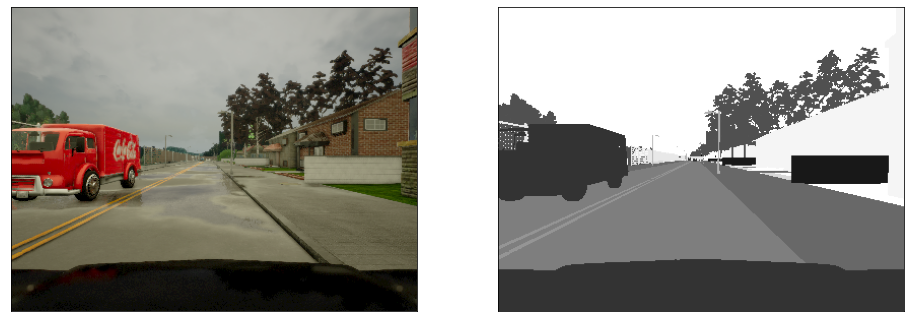

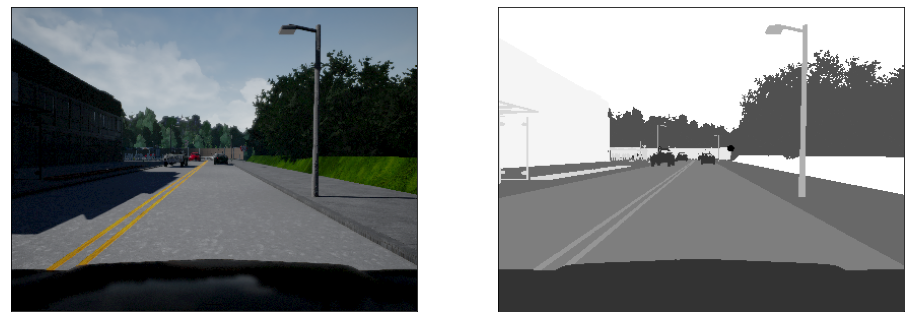

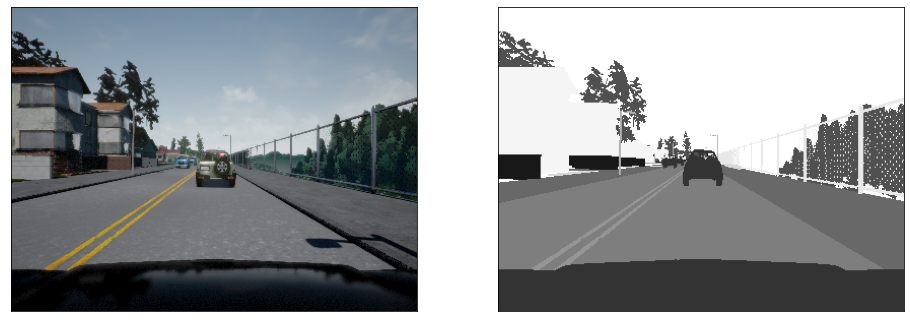

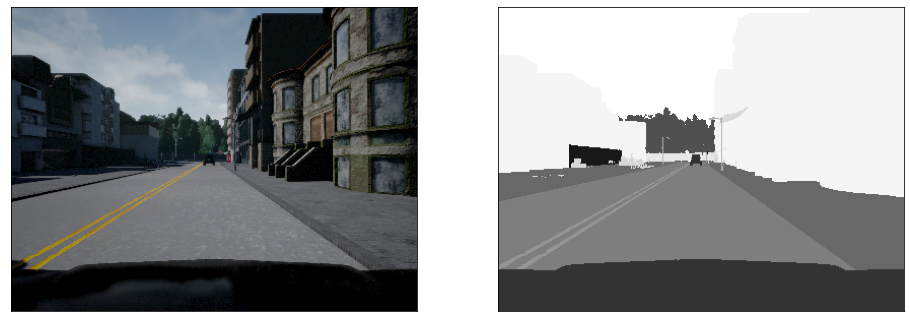

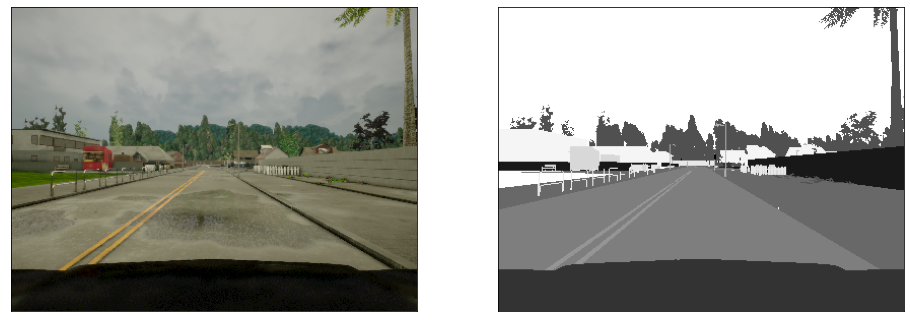

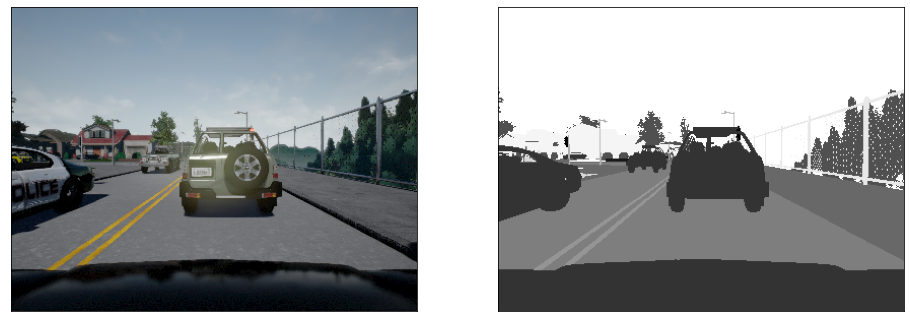

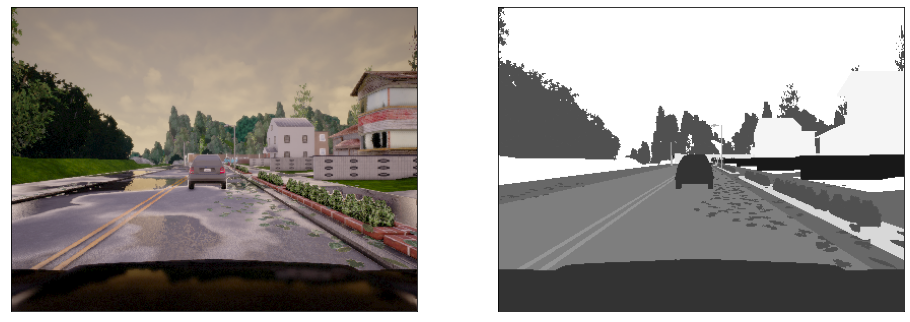

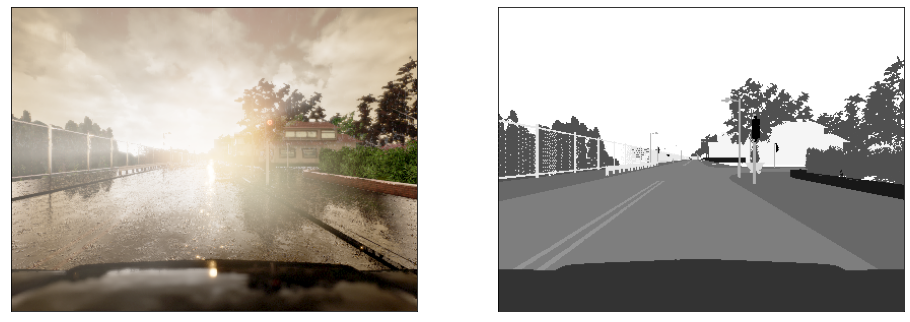

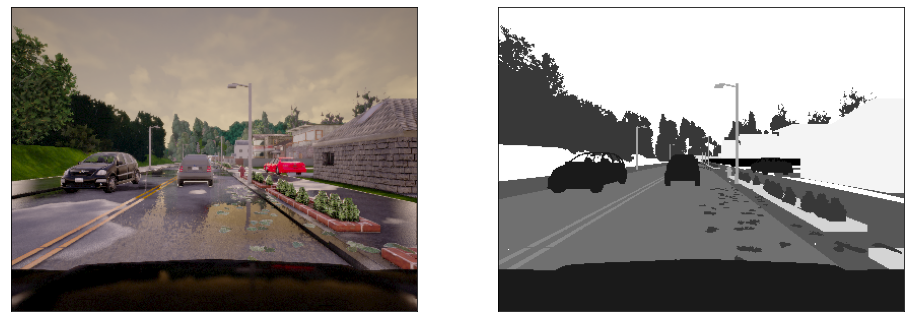

In [4]:
cmap = 'Greys'

print(' '*22 + 'Images:' + ' '*58 + 'Masks:')

for i in range(10):
    num = random.randint(0,5000)
    image,mask = image_and_mask(image_files[num],mask_files[num])
    mask = mask.numpy()
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.xticks(())
    plt.yticks(())
    plt.subplot(1,2,2)
    plt.imshow(mask,cmap=cmap)
    plt.xticks(())
    plt.yticks(())
    plt.show()

### The following functions create a dataset object to be used for training and validating the model.

In [5]:
def augment(image,mask):
    if random.randint(0,1) == 1:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(tf.expand_dims(mask,-1))
        mask = tf.squeeze(mask)
    if random.randint(0,1):
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(tf.expand_dims(mask,-1))
        mask = tf.squeeze(mask)
    return image,mask

batch_size = 24

def make_dataset(images_paths,masks_paths,training=True):
    
    zipped = list(zip(images_paths,masks_paths))
    random.shuffle(zipped)
    zipped = np.array(zipped)
    images_paths = zipped[:,0]
    masks_paths = zipped[:,1]
    
    dataset = tf.data.Dataset.from_tensor_slices((images_paths,masks_paths))
    dataset = dataset.map(image_and_mask)
    if training:
        dataset = dataset.map(augment)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

split_point = 4750

train_image_files = image_files[:split_point]
train_mask_files = mask_files[:split_point]
validation_image_files = image_files[split_point:]
validation_mask_files = mask_files[split_point:]


train_dataset = make_dataset(train_image_files,train_mask_files)
validation_dataset = make_dataset(validation_image_files,validation_mask_files,training=False)

### The model used is referred to as a "u-net" model and was inspired by the paper "U-Net: Convolutional Networks for Biomedical Image Segmentation" by Ronneberger, Fischer, & Brox (2015). 
### A u-net model is a convolutional neural network characterized by a series of convolutional blocks (which consist of convolutional and max pooling layers) that reduce the dimensionality of the images, encoding them in a deeper but otherwise much smaller tensor, followed by a corresponding series of convolutional transpose blocks (which have convolutional transpose, upsampling, and regular convolutional layers) that rebuild the encoded image into its corresponding mask. When visualized, this model is shaped like a U; hence the name. The output is a 300x400x13 tensor in which each pixel gives a probability distribution over a vector of size 13; the place with the highest probability is the predicted class.
### Another important feature of the u-net model is the skip connections. In the convolutional blocks in the first half of the model, each convolutional layer is copied and set aside before going through max pooling. In the second half, when the encoded images are being grown and built into the mask, the saved layers are concatenated with the results of the convolutional transpose layers with equivalent numbers of filters. For example, the convolutional layer with 32 filters towards the beginning of the model is concatenated with the 32-filter convolutional transpose layer at the end of the model, and so on.
### The advantage of using these skip connections is two-fold: First, the non-linear structure prevents the problem of vanishing gradients. When the gradient flow comes from multiple sources, it is much less likely to quickly approach zero. Second, the skip connections enable information from the beginning of the model to move quickly to the end without getting swallowed up in too many layers. This ensures that little data gets lost, as well as creating a divergence in training by which simpler image features (such as the sky or the road) can be modeled with the skip connection (i.e. a much smaller neural network) and more complex features (such as people and traffic lights) can take a longer route through the model and have enough space to train.

In [6]:
def convolutional_block(X,filters,filter_size=(3,3),activation='selu'):
    for i in range(3):
        X = Conv2D(filters,filter_size,activation=activation)(X)
        X = BatchNormalization()(X)
    pooled_layer = MaxPooling2D(2,2)(X)
    return pooled_layer,X

num_classes = 13
dropout_rate = .3

inputs = keras.Input((height,width,3))

X = Conv2D(32,(5,5),activation='selu',padding='same')(inputs)
X = BatchNormalization()(X)

saved_layers = []
filters = 32
for i in range(5):
    X,saved_layer = convolutional_block(X,filters*(2**i))
    saved_layers.append(saved_layer)

X = Conv2D(1024,(3,3),activation='selu')(X)
X = keras.layers.Dropout(dropout_rate)(X)
X = Conv2DTranspose(1024,(3,3),activation='selu')(X)
X = UpSampling2D((2,2))(X)
X = Conv2DTranspose(512,(2,2),activation='selu')(X)
X = concatenate([saved_layers[-1],X])
X = Dropout(dropout_rate)(X)

X = BatchNormalization()(X)
X = Conv2D(512,(3,3),activation='selu')(X)
X = Conv2D(512,(3,3),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(256,(5,5),activation='selu')(X)
X = Conv2DTranspose(256,(5,5),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(256,(3,3),activation='selu')(X)
X = UpSampling2D((2,2))(X)
X = concatenate([saved_layers[-2],X])
X = Dropout(dropout_rate)(X)

X = BatchNormalization()(X)
X = Conv2D(128,(3,2),activation='selu')(X)
X = Conv2DTranspose(128,(5,5),activation='selu')(X)
X = Conv2DTranspose(128,(5,5),activation='selu')(X)
X = BatchNormalization()(X)
X = UpSampling2D((2,2))(X)
X = Conv2DTranspose(128,(2,1),activation='selu')(X)
X = Conv2D(128,(2,2),activation='selu')(X)
X = concatenate([saved_layers[-3],X])
X = Dropout(dropout_rate)(X)

X = BatchNormalization()(X)
X = Conv2D(64,(3,3),activation='selu')(X)
X = Conv2D(64,(3,3),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(64,(3,3),activation='selu')(X)
X = UpSampling2D(2)(X)
X = Conv2DTranspose(64,(2,2),activation='selu')(X)
X = concatenate([saved_layers[-4],X])
X = Dropout(dropout_rate)(X)

X = BatchNormalization()(X)
X = Conv2D(128,(3,3),activation='selu')(X)
X = Conv2D(128,(3,3),activation='selu')(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = Dropout(dropout_rate)(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = Conv2DTranspose(32,(3,3),activation='selu')(X)
X = UpSampling2D(2)(X)
X = concatenate([saved_layers[-5],X])
X = Dropout(dropout_rate)(X)

X = Conv2D(64,(3,3),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2D(64,(3,3),activation='selu')(X)
X = Dropout(dropout_rate)(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2DTranspose(64,(5,5),activation='selu')(X)
X = Dropout(dropout_rate)(X)
X = Conv2DTranspose(32,(3,3),activation='selu')(X)
X = BatchNormalization()(X)
X = Conv2D(32,(1,1),activation='selu')(X)
X = Conv2D(num_classes,(1,1),activation='softmax')(X)

unet_model = keras.Model(inputs=inputs,
                        outputs=X)

optimizer = keras.optimizers.Adam(learning_rate=1e-3)

unet_model.compile(loss='sparse_categorical_crossentropy',
                  optimizer=optimizer,
                  metrics='accuracy')

unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 300, 400, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 300, 400, 32  2432        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 300, 400, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

### The model was trained on a GPU, after which the weights were downloaded and uploaded here. The model is the evaluated on a small subset of both the training and validation data.

In [7]:
weights_path = os.path.join(cd,r'OneDrive\Desktop\Datasets\weights\unet_weights.h5')

unet_model.load_weights(weights_path)

num_samples = 196

train_samples = np.array(random.sample(list(zip(train_image_files,train_mask_files)),num_samples))
val_samples = np.array(random.sample(list(zip(validation_image_files,validation_mask_files)),num_samples))

loss,accuracy = unet_model.evaluate(make_dataset(train_samples[:,0],train_samples[:,1],training=False))
val_loss, val_accuracy = unet_model.evaluate(make_dataset(val_samples[:,0],val_samples[:,1],training=False))

metrics_df = pd.DataFrame({'Loss':[loss,val_loss],'Accuracy':[accuracy,val_accuracy]},
                         index=['Training','Validation'])

print('\n\nLoss and accuracy on training and validation data:')
display(metrics_df)

9/9 [==============================] - 311s 34s/step - loss: 0.0655 - accuracy: 0.9781


Loss and accuracy on training and validation data:


,Loss,Accuracy
Training,0.059220,0.979866
Validation,0.065535,0.978130


### Finally, the model is tested on a random sample set taken from the validation data. You can see how successfuly (or otherwise) the predicted mask is at "seeing" the road.

                      Images:                                                     Predicted mask:


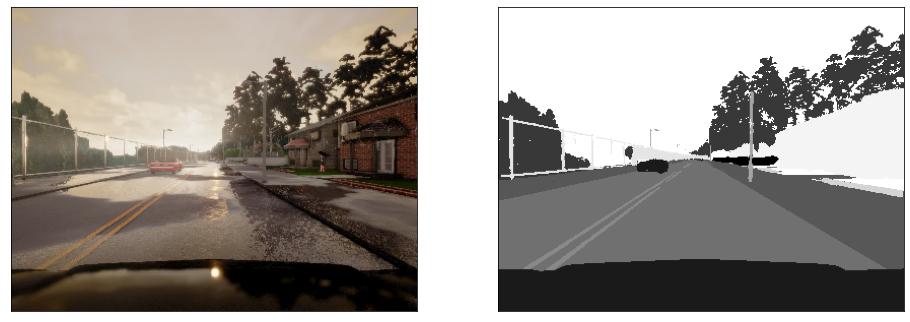

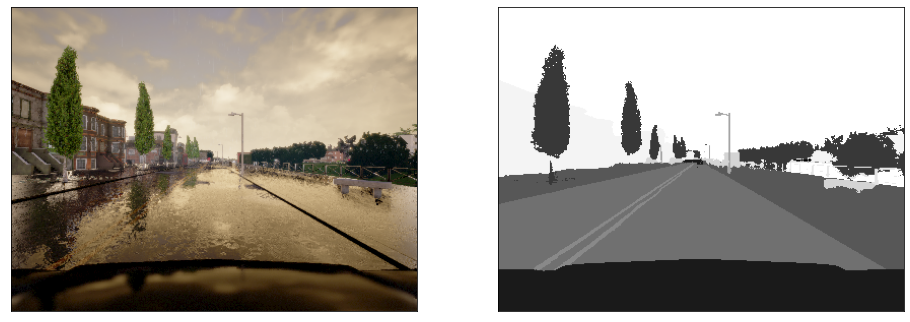

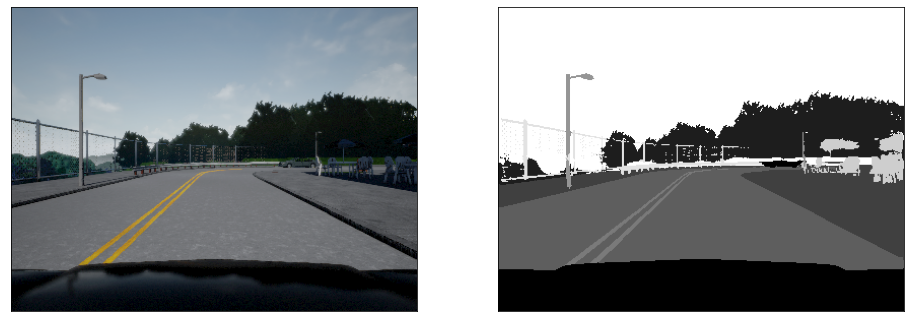

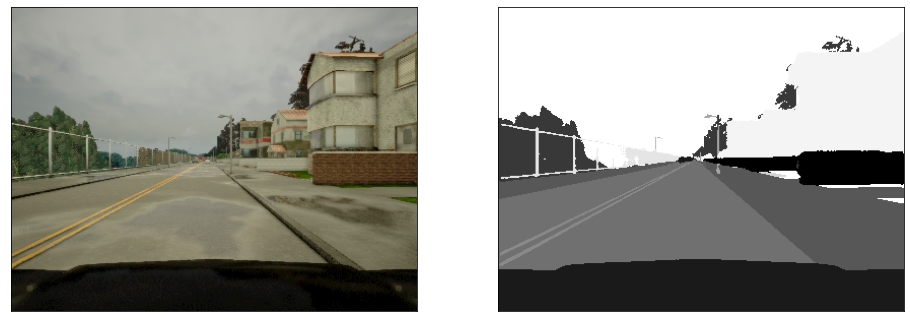

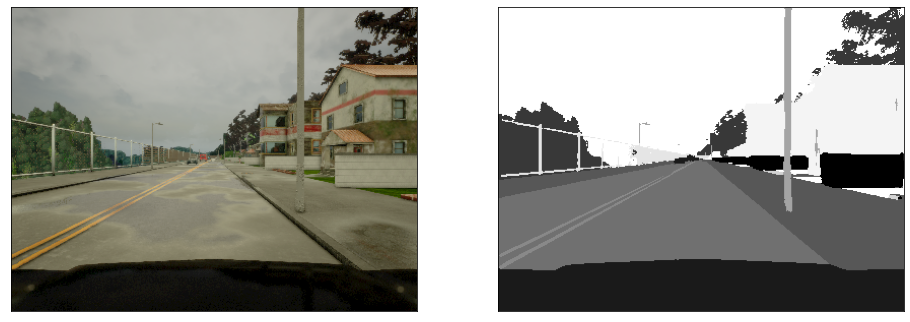

...

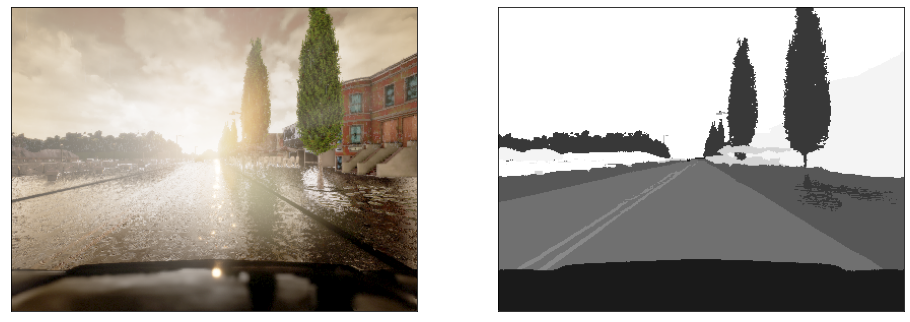

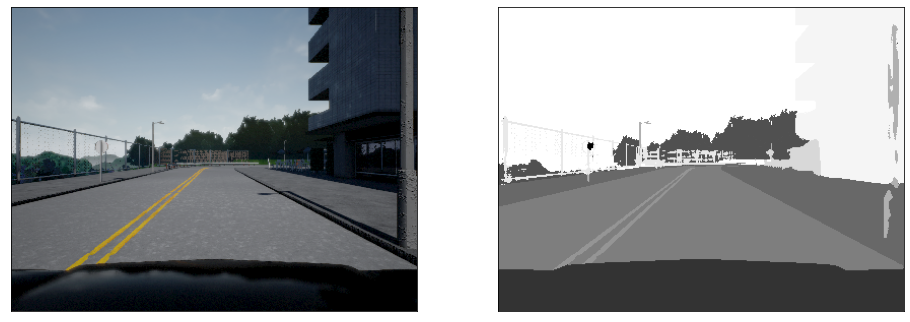

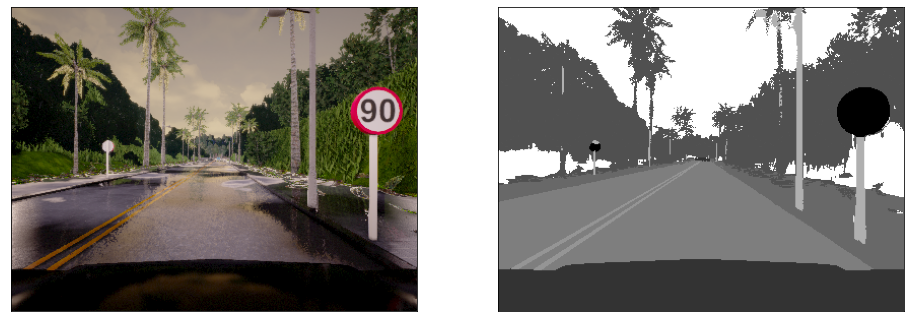

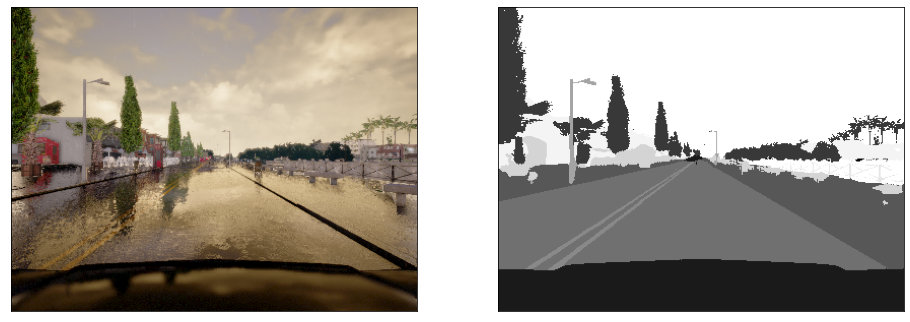

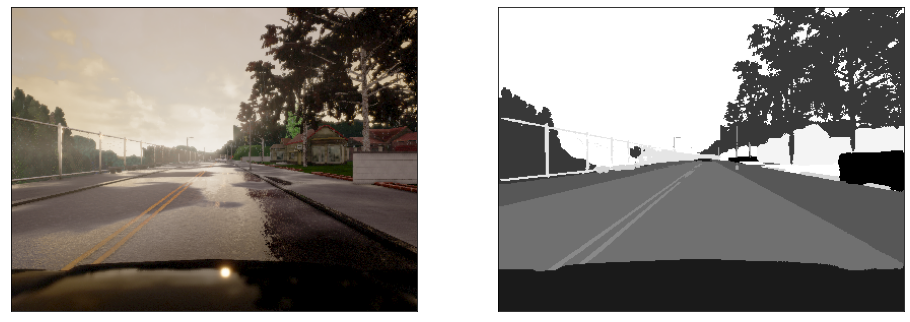

In [8]:
num_examples = 25
examples = random.sample(list(zip(validation_image_files,validation_mask_files)),num_examples)

print(' '*22 + 'Images:' + ' '*53 + 'Predicted mask:')

for image_file,mask_file in examples:
    
    image,mask = image_and_mask(image_file,mask_file)
    predicted_mask = unet_model.predict(tf.expand_dims(image,0)).squeeze().argmax(axis=-1)
    
    image = tf.cast(image,tf.float32)
    predicted_mask = tf.cast(predicted_mask,tf.float32)
    
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.xticks(())
    plt.yticks(())
    plt.subplot(1,2,2)
    plt.imshow(predicted_mask,cmap=cmap)
    plt.xticks(())
    plt.yticks(())
    plt.show()